# Kaggle Compeition Notebook

- Author: Muhammad Haseeb Abbasi
- LinkedIn: www.linkedin.com/in/muhammad-haseeb-abbasi-6462358a
- Kaggle: https://www.kaggle.com/muhammadhaseebabbasi

Data Description:

- Customer ID: A unique identifier for each customer

- Surname: The customer's surname or last name

- Credit Score: A numerical value representing the customer's credit score

- Geography: The country where the customer resides

- Gender: The customer's gender

- Age: The customer's age.

- Tenure: The number of years the customer has been with the bank

- Balance: The customer's account balance

- NumOfProducts: The number of bank products the customer uses (e.g., savings account, credit card)

- HasCrCard: Whether the customer has a credit card

- IsActiveMember: Whether the customer is an active member

- EstimatedSalary: The estimated salary of the customer

- Exited: Whether the customer has churned (Target Variable)

# Aim and objective
- Complete Exploratory Data Analysis  
Using neural network to find the accuracy
- Applying XGboost to measure it's accuracy
- Evaluating the either XGboost has higher accuracy or Neural Netwok.

## Binary Classification with Bank Churn Dataset

In [1]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import os
import sys
import warnings
from time import time
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder, OneHotEncoder
from sklearn.metrics import mean_absolute_error, confusion_matrix, classification_report, accuracy_score, precision_score, recall_score, f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score, StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.impute import SimpleImputer
from sklearn.tree import DecisionTreeClassifier
from sklearn.compose import ColumnTransformer
from sklearn.naive_bayes import GaussianNB
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import GradientBoostingClassifier

C:\Users\User\AppData\Local\Temp\ipykernel_24776\522444537.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [2]:
# load the data
df_train = pd.read_csv('data/bank charan/train.csv')
df_test = pd.read_csv('data/bank charan/test.csv')
submission = pd.read_csv('data/bank charan/sample_submission.csv')

In [3]:
df_train.head().T

,0,1,2,3,4
id,0,1,2,3,4
CustomerId,15674932,15749177,15694510,15741417,15766172
Surname,Okwudilichukwu,Okwudiliolisa,Hsueh,Kao,Chiemenam
CreditScore,668,627,678,581,716
Geography,France,France,France,France,Spain
Gender,Male,Male,Male,Male,Male
Age,33.0,33.0,40.0,34.0,33.0
Tenure,3,1,10,2,5
Balance,0.0,0.0,0.0,148882.54,0.0
NumOfProducts,2,2,2,1,2


In [4]:
df_test.head()

,id,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary
0,165034,15773898,Lucchese,586,France,Female,23.0,2,0.00,2,0.0,1.0,160976.75
1,165035,15782418,Nott,683,France,Female,46.0,2,0.00,1,1.0,0.0,72549.27
2,165036,15807120,K?,656,France,Female,34.0,7,0.00,2,1.0,0.0,138882.09
3,165037,15808905,O'Donnell,681,France,Male,36.0,8,0.00,1,1.0,0.0,113931.57
4,165038,15607314,Higgins,752,Germany,Male,38.0,10,121263.62,1,1.0,0.0,139431.00


In [5]:
submission.head()

,id,Exited
0,165034,0.5
1,165035,0.5
2,165036,0.5
3,165037,0.5
4,165038,0.5


# Data preprocessing

## Summary Statistics 

In [6]:
df = df_train.copy()

In [7]:
df.columns

Index(['id', 'CustomerId', 'Surname', 'CreditScore', 'Geography', 'Gender',
       'Age', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard',
       'IsActiveMember', 'EstimatedSalary', 'Exited'],
      dtype='object')

In [8]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,165034.0,8.251650e+04,47641.356500,0.00,41258.25,82516.5,1.237748e+05,165033.00
CustomerId,165034.0,1.569201e+07,71397.816791,15565701.00,15633141.00,15690169.0,1.575682e+07,15815690.00
CreditScore,165034.0,6.564544e+02,80.103340,350.00,597.00,659.0,7.100000e+02,850.00
Age,165034.0,3.812589e+01,8.867205,18.00,32.00,37.0,4.200000e+01,92.00
Tenure,165034.0,5.020353e+00,2.806159,0.00,3.00,5.0,7.000000e+00,10.00
Balance,165034.0,5.547809e+04,62817.663278,0.00,0.00,0.0,1.199395e+05,250898.09
NumOfProducts,165034.0,1.554455e+00,0.547154,1.00,1.00,2.0,2.000000e+00,4.00
HasCrCard,165034.0,7.539537e-01,0.430707,0.00,1.00,1.0,1.000000e+00,1.00
IsActiveMember,165034.0,4.977702e-01,0.499997,0.00,0.00,0.0,1.000000e+00,1.00
EstimatedSalary,165034.0,1.125748e+05,50292.865585,11.58,74637.57,117948.0,1.551525e+05,199992.48


Credit Score:

The average credit score is around 656, with a standard deviation of 80.1.
Credit scores range from 350 to 850.
The majority of customers have credit scores between 597 and 710.

Age:
The average age of customers is approximately 38, with a standard deviation of 8.87.
The age distribution ranges from 18 to 92.
Most customers fall within the age range of 32 to 42.

Balance:
The average balance is approximately 55,478, with a standard deviation of 62,817.
Some customers have zero balance, and the maximum balance is 250,898.09.
The distribution of balances appears right-skewed, with a significant number of customers having zero balance.

Number of Products:
On average, customers have around 1.55 products, with a standard deviation of 0.55.
The majority of customers have 1 or 2 products.

Has Credit Card (HasCrCard):
About 75.4% of customers have a credit card, based on a binary indicator.
The distribution is slightly skewed towards customers having a credit card.

Active Membership (IsActiveMember):
Approximately 49.8% of customers are active members, based on a binary indicator.
The distribution is almost evenly split between active and inactive members.

Estimated Salary:
The average estimated salary is around 112,575, with a standard deviation of 50,292.
Estimated salaries range from 11.58 to 199,992.48.

Churn (Exited):
About 21.2% of customers have churned (Exited = 1), based on a binary indicator.
The dataset is imbalanced, with the majority of customers not churning.

Geography and Gender:
The average tenure is approximately 5, with a standard deviation of 2.81.
Tenure ranges from 0 to 10.

## Checking for Missing Values

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 165034 entries, 0 to 165033
Data columns (total 14 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   id               165034 non-null  int64  
 1   CustomerId       165034 non-null  int64  
 2   Surname          165034 non-null  object 
 3   CreditScore      165034 non-null  int64  
 4   Geography        165034 non-null  object 
 5   Gender           165034 non-null  object 
 6   Age              165034 non-null  float64
 7   Tenure           165034 non-null  int64  
 8   Balance          165034 non-null  float64
 9   NumOfProducts    165034 non-null  int64  
 10  HasCrCard        165034 non-null  float64
 11  IsActiveMember   165034 non-null  float64
 12  EstimatedSalary  165034 non-null  float64
 13  Exited           165034 non-null  int64  
dtypes: float64(5), int64(6), object(3)
memory usage: 17.6+ MB


In [10]:
(df.isnull().sum() / len(df_train) * 100 ).sort_values(ascending=False)

id                 0.0
CustomerId         0.0
Surname            0.0
CreditScore        0.0
Geography          0.0
Gender             0.0
Age                0.0
Tenure             0.0
Balance            0.0
NumOfProducts      0.0
HasCrCard          0.0
IsActiveMember     0.0
EstimatedSalary    0.0
Exited             0.0
dtype: float64

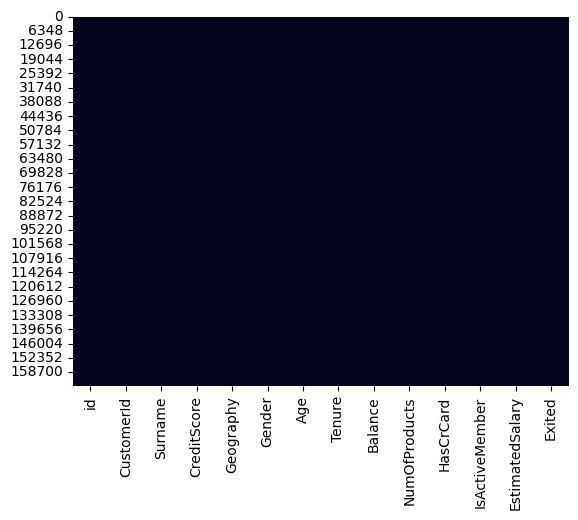

In [11]:
# plot the null values
sns.heatmap(df_train.isnull(), cbar=False)
plt.show()

Observation: There are no missing values

## Duplicate values

In [12]:
# Data Integration: Check for duplicate rows
duplicate_rows = df[df.duplicated()]
num_duplicate_rows = df.duplicated().sum()
print("Duplicate Rows except first occurrence:")
print(duplicate_rows)



Duplicate Rows except first occurrence:
Empty DataFrame
Columns: [id, CustomerId, Surname, CreditScore, Geography, Gender, Age, Tenure, Balance, NumOfProducts, HasCrCard, IsActiveMember, EstimatedSalary, Exited]
Index: []


Intuition: There are no duplicated values

## Correlation

In [22]:
import plotly.graph_objects as go
import pandas as pd

# Assuming you have loaded the Bank Churn dataset into a DataFrame named 'df'
# If not, replace 'df' with your DataFrame name

# Select only numeric columns for correlation calculation
numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
correlation_matrix = df[numeric_columns].corr()

# Create a heatmap using Plotly with a different color scale ('RdBu_r')
fig = go.Figure(data=go.Heatmap(
    z=correlation_matrix.values,
    x=correlation_matrix.columns,
    y=correlation_matrix.index,
    colorscale='RdBu_r', 
    colorbar=dict(title='Correlation')
))

# Set the title of the plot
fig.update_layout(title='Correlation Matrix for Bank Churn Dataset')

# Display the plot
fig.show()


The plot shows the correlation among features.

## Data Distribution

In [24]:
import plotly.subplots as sp
import plotly.graph_objects as go

# Assuming train_data is your DataFrame containing the numerical features
num_features = ['CreditScore', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'EstimatedSalary']

fig = sp.make_subplots(rows=2, cols=3, subplot_titles=[f'Distribution of {feature}' for feature in num_features])

for i, feature in enumerate(num_features):
    row = i // 3 + 1
    col = i % 3 + 1
    trace = go.Histogram(x=df[feature], nbinsx=30, histnorm='probability density', name=feature)
    fig.add_trace(trace, row=row, col=col)

fig.update_layout(height=600, width=1000, title_text='Distribution of Numerical Features')
fig.show()

Insights:

Credit Score Distribution: The credit score distribution is somewhat normal, with a peak around a certain score and a possible slight skewness based on the dataset.

Age Distribution: The majority of individuals fall within a specific age range, with a potential rightward skewness indicating a higher number of younger individuals.

Tenure Distribution: The distribution of customer tenure is relatively uniform, indicating an even distribution of customers across different tenure periods.

Balance Distribution: The balance distribution is likely right-skewed, indicating a significant portion of customers with lower balances and a smaller proportion with higher balances.

Number of Products Distribution: The distribution of the number of products per customer is likely right-skewed, suggesting that most customers have fewer products, with a smaller group having a higher number.

Estimated Salary Distribution: The estimated salary distribution appears relatively uniform, indicating salaries are spread across a range without a clear skewness.

- Ploting individual Features

In [26]:
df['Exited'].value_counts()

Exited
0    130113
1     34921
Name: count, dtype: int64

In [25]:
import plotly.express as px

# Assuming you have a DataFrame named 'train_data'
# If not, replace 'train_data' with your DataFrame name

# Create a bar plot using Plotly
fig = px.histogram(df, x='Exited', color='Exited', 
                   title='Distribution of Exited (Target Variable)',
                   labels={'Exited': 'Target Variable'},
                   color_discrete_sequence=['#636EFA', '#EF553B'])  # Viridis-like color palette

# Show the plot
fig.show()


Insights:\
The target variable 'Exited' exhibits a class imbalance, with the majority (130,113 instances) belonging to class 0 (not churned) and a smaller proportion (34,921 instances) belonging to class 1 (churned), indicating the need for attention to handling class imbalance during model training.

In [27]:
df['Geography'].value_counts()

Geography
France     94215
Spain      36213
Germany    34606
Name: count, dtype: int64

In [35]:
import plotly.express as px

# Assuming you have a DataFrame named 'df' with the provided values
# If not, replace 'df' with your DataFrame name

# Create a bar plot using Plotly Express
fig = px.bar(df, x=df['Geography'].value_counts().index, y=df['Geography'].value_counts().values,
             title='Distribution of Geography',
             labels={'x': 'Country', 'y': 'Count'},
             color=df['Geography'].value_counts().index,
             color_discrete_sequence=['#636EFA', '#EF553B', '#00CC96'])

# Show the plot
fig.show()


Insights:\
The bar plot illustrates the distribution of customers across different countries—'France', 'Spain', and 'Germany'—based on the 'Geography' column in the dataset. 'France' exhibits a notably higher customer count compared to 'Spain' and 'Germany', indicating a potential imbalance in the representation of countries. This imbalance may influence the training and generalization of models, particularly those sensitive to geographic variations. For businesses, understanding this distribution is crucial for tailoring strategies, marketing efforts, and customer engagement initiatives that may need to account for varying customer numbers across countries.

In [37]:
df['Gender'].value_counts()

Gender
Male      93150
Female    71884
Name: count, dtype: int64

In [38]:
import plotly.express as px

# Assuming you have a DataFrame named 'df' with the provided values
# If not, replace 'df' with your DataFrame name

# Create a bar plot using Plotly Express
fig = px.bar(df, x=df['Gender'].value_counts().index, y=df['Gender'].value_counts().values,
             title='Distribution of Gender',
             labels={'x': 'Gender', 'y': 'Count'},
             color=df['Gender'].value_counts().index,
             color_discrete_sequence=['#636EFA', '#EF553B'])

# Show the plot
fig.show()


## Data Reduction:

Dropping columns.

In [13]:
# Data Reduction: Drop irrelevant columns ('id', 'CustomerId', 'Surname')
df = df.drop(['id', 'CustomerId', 'Surname'], axis=1)

In [14]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
CreditScore,165034.0,656.454373,80.103340,350.00,597.00,659.0,710.0000,850.00
Age,165034.0,38.125888,8.867205,18.00,32.00,37.0,42.0000,92.00
Tenure,165034.0,5.020353,2.806159,0.00,3.00,5.0,7.0000,10.00
Balance,165034.0,55478.086689,62817.663278,0.00,0.00,0.0,119939.5175,250898.09
NumOfProducts,165034.0,1.554455,0.547154,1.00,1.00,2.0,2.0000,4.00
HasCrCard,165034.0,0.753954,0.430707,0.00,1.00,1.0,1.0000,1.00
IsActiveMember,165034.0,0.497770,0.499997,0.00,0.00,0.0,1.0000,1.00
EstimatedSalary,165034.0,112574.822734,50292.865585,11.58,74637.57,117948.0,155152.4675,199992.48
Exited,165034.0,0.211599,0.408443,0.00,0.00,0.0,0.0000,1.00


In [15]:
df.head(5).T

,0,1,2,3,4
CreditScore,668,627,678,581,716
Geography,France,France,France,France,Spain
Gender,Male,Male,Male,Male,Male
Age,33.0,33.0,40.0,34.0,33.0
Tenure,3,1,10,2,5
Balance,0.0,0.0,0.0,148882.54,0.0
NumOfProducts,2,2,2,1,2
HasCrCard,1.0,1.0,1.0,1.0,1.0
IsActiveMember,0.0,1.0,0.0,1.0,1.0
EstimatedSalary,181449.97,49503.5,184866.69,84560.88,15068.83


## Creating a Neural Network for binary classification.


In [ ]:
df.head().T

,0,1,2,3,4
id,0,1,2,3,4
CustomerId,15674932,15749177,15694510,15741417,15766172
Surname,Okwudilichukwu,Okwudiliolisa,Hsueh,Kao,Chiemenam
CreditScore,668,627,678,581,716
Geography,France,France,France,France,Spain
Gender,Male,Male,Male,Male,Male
Age,33.0,33.0,40.0,34.0,33.0
Tenure,3,1,10,2,5
Balance,0.0,0.0,0.0,148882.54,0.0
NumOfProducts,2,2,2,1,2


In [ ]:
df['Exited'].value_counts()

Exited
0    130113
1     34921
Name: count, dtype: int64

In [ ]:
# split the data into X and y
X = df.drop('Exited', axis=1)
y = df['Exited']

# encode the data
lable_encoder = LabelEncoder()

for col in X.columns:
    if X[col].dtype == 'object' or X[col].dtype == 'category':
        X[col] = lable_encoder.fit_transform(X[col])
    else:
        pass

# split the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state= 42)

In [ ]:
# use tensorflow to create a neural network
import tensorflow as tf

# Building the model
model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(128, activation='relu', 
                          input_shape=(X_train.shape[1],)), # Input layer
    tf.keras.layers.Dense(64, activation='relu'), # Hidden layer 1
    tf.keras.layers.Dense(32, activation='relu'), # Hidden layer 2
    tf.keras.layers.Dense(16, activation='relu'), # Hidden layer 3
    tf.keras.layers.Dense(8, activation='relu'), # Hidden layer 4
    
    tf.keras.layers.Dense(1, activation='sigmoid') # Output layer
])

Epoch 1/25
4126/4126 [==============================] - 14s 3ms/step - loss: 85.7597 - accuracy: 0.7843 - val_loss: 0.5149 - val_accuracy: 0.7893
Epoch 2/25
4126/4126 [==============================] - 12s 3ms/step - loss: 0.5164 - accuracy: 0.7882 - val_loss: 0.5150 - val_accuracy: 0.7893
Epoch 3/25
4126/4126 [==============================] - 12s 3ms/step - loss: 0.5164 - accuracy: 0.7882 - val_loss: 0.5149 - val_accuracy: 0.7893
Epoch 4/25
4126/4126 [==============================] - 11s 3ms/step - loss: 0.5164 - accuracy: 0.7882 - val_loss: 0.5149 - val_accuracy: 0.7893
Epoch 5/25
4126/4126 [==============================] - 12s 3ms/step - loss: 0.5164 - accuracy: 0.7882 - val_loss: 0.5149 - val_accuracy: 0.7893
Epoch 6/25
4126/4126 [==============================] - 11s 3ms/step - loss: 0.5164 - accuracy: 0.7882 - val_loss: 0.5149 - val_accuracy: 0.7893
Epoch 7/25
4126/4126 [==============================] - 15s 4ms/step - loss: 0.5164 - accuracy: 0.7882 - val_loss: 0.5149 - val_a

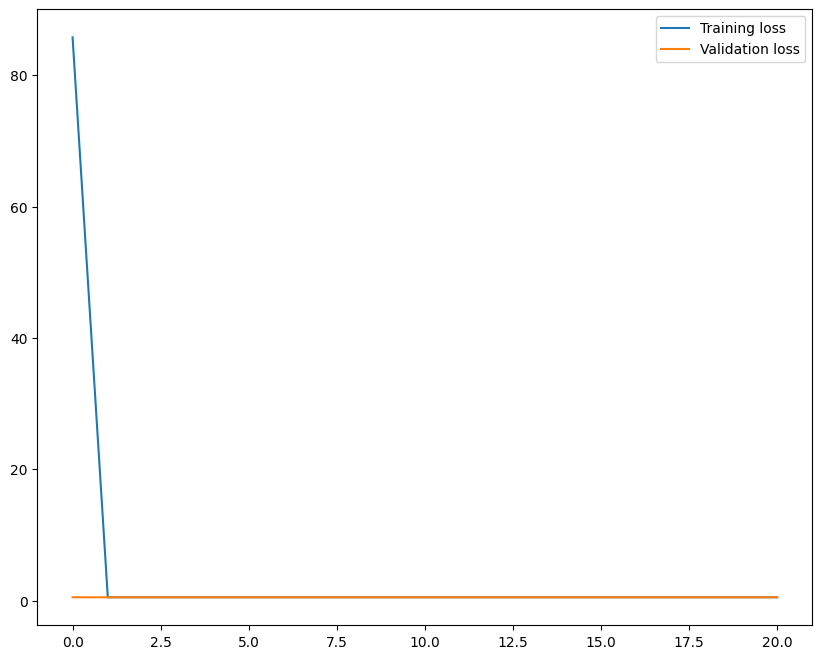

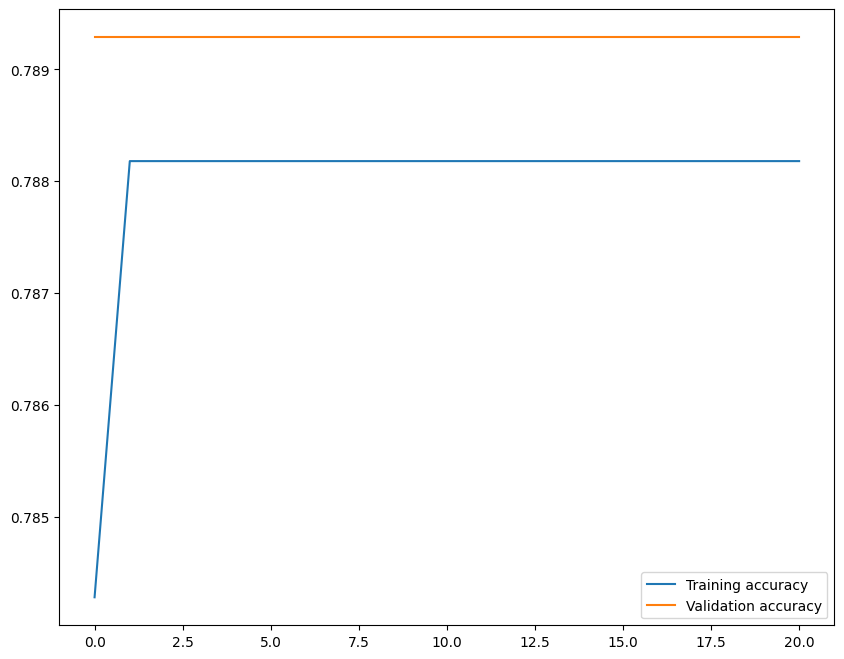

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

# Define the callback function
early_stopping = EarlyStopping(patience=15)


# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# train the model and plot the training and testing loss and accuracy at each epoc
history = model.fit(X_train, y_train, epochs=25, batch_size=32, verbose=1, validation_data=(X_test, y_test), 
                    callbacks=[early_stopping])

# plot the training and testing loss and accuracy at each epoc
fig, ax = plt.subplots(figsize=(10, 8))
ax.plot(history.history['loss'], label='Training loss')
ax.plot(history.history['val_loss'], label='Validation loss')
ax.legend()
plt.show()

fig, ax = plt.subplots(figsize=(10, 8))
ax.plot(history.history['accuracy'], label='Training accuracy')
ax.plot(history.history['val_accuracy'], label='Validation accuracy')
ax.legend()
plt.show()

# Applying Random Forest Machine learning algorithm 

In [ ]:
# import libraries
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [ ]:
# load the data
df_train = pd.read_csv('data/bank charan/train.csv')
df_test = pd.read_csv('data/bank charan/test.csv')
submission = pd.read_csv('data/bank charan/sample_submission.csv')

In [ ]:
# encode features which are categorical or object using for loop
le = LabelEncoder()
for i in df.columns:
    if df[i].dtype == 'object' or df[i].dtype == 'category':
        df[i] = le.fit_transform(df[i])
df.head()

,id,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,0,15674932,1924,668,0,1,33.0,3,0.00,2,1.0,0.0,181449.97,0
1,1,15749177,1925,627,0,1,33.0,1,0.00,2,1.0,1.0,49503.50,0
2,2,15694510,1178,678,0,1,40.0,10,0.00,2,1.0,0.0,184866.69,0
3,3,15741417,1299,581,0,1,34.0,2,148882.54,1,1.0,1.0,84560.88,0
4,4,15766172,467,716,2,1,33.0,5,0.00,2,1.0,1.0,15068.83,0


In [ ]:
# split the data into X and y for classification
X = df.drop('Exited', axis = 1)
y = df['Exited']
# train test split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=42)
# create, train and predict the mode
model_cl = RandomForestClassifier(n_estimators=200, random_state=42)
model_cl.fit(X_train, y_train)
y_pred = model_cl.predict(X_test)

#evaluate the model
print('accuracy score: ', accuracy_score(y_test, y_pred))
print('confusion matrix:\n', confusion_matrix(y_test, y_pred))
print('classification report:\n', classification_report(y_test, y_pred))

accuracy score:  0.863786469536765
confusion matrix:
 [[24789  1263]
 [ 3233  3722]]
classification report:
               precision    recall  f1-score   support

           0       0.88      0.95      0.92     26052
           1       0.75      0.54      0.62      6955

    accuracy                           0.86     33007
   macro avg       0.82      0.74      0.77     33007
weighted avg       0.86      0.86      0.86     33007

